<a href="https://colab.research.google.com/github/MehdiBenSalah/pfa/blob/main/Reconstruction3D_POUMONS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
%matplotlib inline

path='/content/drive/MyDrive/PNG_Norm_luna_img_mask/CT_images/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd'
data =sitk.ReadImage(path)
print(data)
spacing = data.GetSpacing()
print('spacing: ', spacing)
scan = sitk.GetArrayFromImage(data)

In [4]:
def plot_ct_scan(scan, num_column=4, jump=1):
    num_slices = len(scan)
    num_row = (num_slices//jump + num_column - 1) // num_column
    f, plots = plt.subplots(num_row, num_column, figsize=(num_column*5, num_row*5))
    for i in range(0, num_row*num_column):
        plot = plots[i % num_column] if num_row == 1 else plots[i // num_column, i % num_column]        
        plot.axis('off')
        if i < num_slices//jump:
            plot.imshow(scan[i*jump], cmap=plt.cm.bone) 


In [5]:
import numpy as np
from skimage import measure, feature
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def plot_3d(image, threshold=-400):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    # p = p[:,:,::-1]
    
    verts,faces = measure.marching_cubes_classic(p, threshold) # try without classic later

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.1)
    face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()

# 3D PLOTTING BONE   
#plot_3d(scan,300)
# 3D PLOTTING LUNG    


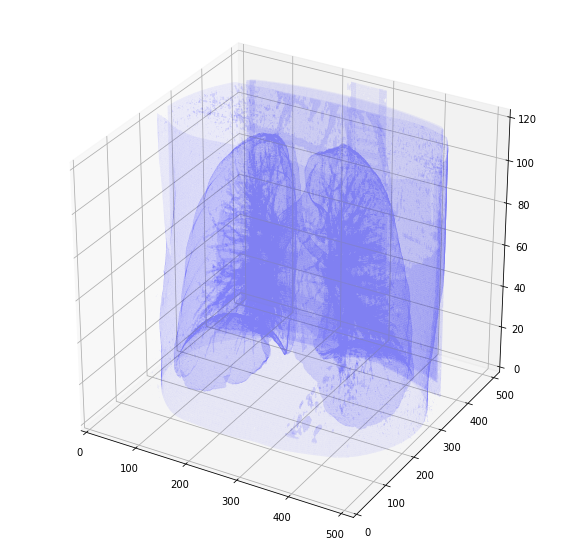

In [6]:
plot_3d(scan,-500)

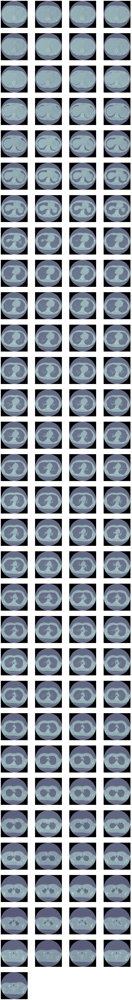

In [8]:
plot_ct_scan(scan)

In [7]:
!pip install scikit-image

In [9]:
from skimage.segmentation import clear_border
from skimage.measure import label,regionprops, perimeter
from skimage.morphology import ball, disk, dilation, binary_erosion, remove_small_objects, erosion, closing, reconstruction, binary_closing
from skimage.filters import roberts, sobel
from scipy import ndimage as ndi
import scipy.ndimage
import numpy as np


def get_segmented_lungs(im, spacing, threshold=-400):
    
    '''
    This funtion segments the lungs from the given 2D slice.
    '''
    '''
    Step 1: Convert into a binary image. 
    '''
    binary = im < threshold

    '''
    Step 2: Remove the blobs connected to the border of the image.
    '''
    cleared = clear_border(binary)

    '''
    Step 3: Label the image.
    '''
    label_image = label(cleared)
    
    '''
    Step 4: Keep the labels with 2 largest areas.
    '''
    areas = [r.area for r in regionprops(label_image)]
    areas.sort()
    if len(areas) > 2:
        for region in regionprops(label_image):
            if region.area < areas[-2]:
                for coordinates in region.coords:                
                       label_image[coordinates[0], coordinates[1]] = 0
    binary = label_image > 0

    '''
    Step 5: Erosion operation with a disk of radius 2. This operation is 
    seperate the lung nodules attached to the blood vessels.
    '''
    selem = disk(2)
    binary = binary_erosion(binary, selem)

    '''
    Step 6: Closure operation with a disk of radius 10. This operation is 
    to keep nodules attached to the lung wall.
    '''
    selem = disk(10)
    binary = binary_closing(binary, selem)

    edges = roberts(binary)
    binary = ndi.binary_fill_holes(edges)

    return binary


mask = np.array([get_segmented_lungs(slice.copy(), spacing) for slice in scan])
scan[~mask] = 0



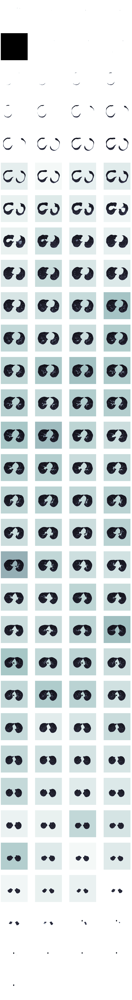

In [10]:
plot_ct_scan(scan)

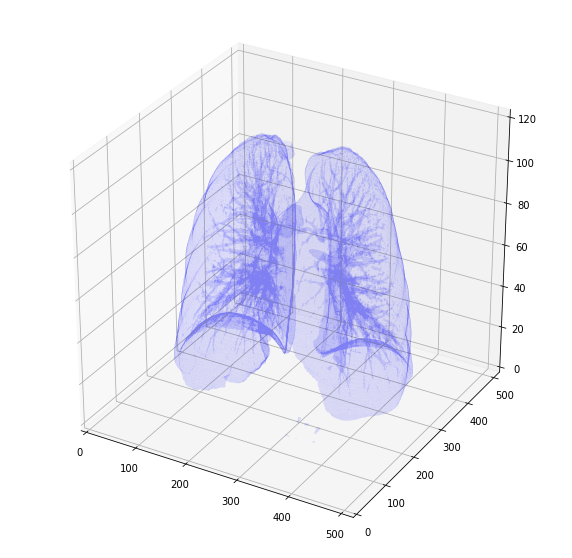

In [11]:
plot_3d(scan,-500)